In [1]:
import pandas as pd
df = pd.read_csv("mirror_publications_etherscan.csv")
df

,Writing NFT,Author Homepage,Total Sold(ETH),Total Sold Numbers,Total Buyers,Price(ETH),nft_address,collection,fees,created_date,...,week_google_searches_nft,week_google_searches_crypto,week_google_searches_bitcoin,week_google_searches_ethereum,week_google_searches_optimism,Success,SuccessBinary,author_address,author_ether_balance,author_transactions_number
0,https://opensea.io/assets/optimism/0x26bbb507d...,https://mirror.xyz/0xf4cdb62c9a66c749cdf736c43...,0.5900,59,53,0.0100,0x26bbb507daa7c0dec6a578a09f0d7ac85ff6fec5,man1f3st0,"[2.5, 10.0]",2022-08-16,...,74,49,36,56,35,59000.0,1,0xf4cdb62c9a66c749cdf736c43e96ff11d2bab444,0.014894,10.0
1,https://opensea.io/assets/optimism/0x3e21e1d8e...,https://mirror.xyz/0x4ced9817cad891aeffbf5fb7d...,2.0000,200,198,0.0100,0x3e21e1d8e89d675aca9708aee0ae05c7f6622c29,canto-genesis,"[2.5, 10.0]",2022-08-16,...,74,49,36,56,35,200000.0,1,0x4ced9817cad891aeffbf5fb7dcb6f3c6aebd4228,0.016364,2.0
2,https://opensea.io/assets/optimism/0xdd81b24ec...,https://mirror.xyz/0xb8dbf8e09c1cb83da9632e137...,0.0001,1,1,0.0001,0xdd81b24ec7813d0fc8570bfd5008271037122349,niswap-airdrop-iron,"[2.5, 10.0]",2022-08-16,...,74,49,36,56,35,10.0,0,0xb8dbf8e09c1cb83da9632e137559a4471646d633,0.000000,0.0
3,https://opensea.io/assets/optimism/0xd283a8373...,https://mirror.xyz/0xc065e02d562cc390f35693059...,0.0000,53,53,0.0001,0xd283a8373ada1285547bba0d36556ea47ac25c54,trading-on-kwenta-mobile,"[2.5, 10.0]",2022-08-16,...,74,49,36,56,35,530.0,1,0xc065e02d562cc390f3569305990bfd13b17eec6b,0.000098,10.0
4,https://opensea.io/assets/optimism/0x3fada15d6...,https://mirror.xyz/0x0df68ee531dab63d651132c7f...,0.0000,2,2,0.0001,0x3fada15d698a86a23e871d9b1bea9877e38e1e6b,some-words-about-rabbithole,"[2.5, 10.0]",2022-08-16,...,74,49,36,56,35,20.0,0,0x0df68ee531dab63d651132c7f56c6cdfe2689d19,0.010063,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26870,https://opensea.io/assets/optimism/0x81457615f...,https://mirror.xyz/0xd5f09257a7b7d070c39e6b473...,0.0000,2,2,0.0001,0x81457615fcd852e1d51ec8273d0ef6e95e4a7da6,unlock-the-full-potential-of-safe-wallet-sign-...,[2.5],2024-11-18,...,26,100,84,53,43,20.0,0,0xd5f09257a7b7d070c39e6b4737933324456b6211,0.092097,10.0
26871,https://opensea.io/assets/optimism/0xd84035bc2...,https://mirror.xyz/0x489e3e846bb550cb7b023108c...,0.0000,5,5,0.0001,0xd84035bc253d7ab99d3e05c1d1f6d1185300a602,the-governance-staking-era,[2.5],2024-11-18,...,26,100,84,53,43,50.0,1,0x489e3e846bb550cb7b023108ce071bb39fd23cd8,0.012132,10.0
26872,https://opensea.io/assets/optimism/0x3403ab72d...,https://mirror.xyz/0x5ee94b80d60880f25048b6158...,0.0000,1,1,0.0001,0x3403ab72df88717d4b9067fc08daf07949bab830,superchain-sunday-week-46-2024,[2.5],2024-11-18,...,26,100,84,53,43,10.0,0,0x5ee94b80d60880f25048b61588d8cb23c79aa3ae,0.014976,10.0
26873,https://opensea.io/assets/optimism/0x9fff9c16f...,https://mirror.xyz/0x9ad0cb287b57828a2fb2b738d...,0.0000,4,4,0.0001,0x9fff9c16fde288329a2b663697ef2d04e967b4a9,the-morpho-dao-to-enable-transferability-for-m...,[2.5],2024-11-18,...,26,100,84,53,43,40.0,1,0x9ad0cb287b57828a2fb2b738da2e2f4727eaed28,0.000000,0.0


In [2]:
# Calcoliamo i terzili per dividere i dati in 3 classi bilanciate
terzili = df["Success"].quantile([1/3, 2/3]).values

# Creiamo la colonna "SuccessClass3" in base ai terzili
df["SuccessClass3"] = pd.cut(df["Success"], bins=[-float("inf"), terzili[0], terzili[1], float("inf")], labels=[0, 1, 2])

# Calcoliamo i quartili per dividere i dati in 4 classi bilanciate
quartili = df["Success"].quantile([1/4, 2/4, 3/4]).values

# Creiamo la colonna "SuccessClass4" in base ai quartili
df["SuccessClass4"] = pd.cut(df["Success"], bins=[-float("inf"), quartili[0], quartili[1], quartili[2], float("inf")], labels=[0, 1, 2, 3])

# Verifica delle distribuzioni
class_counts_3 = df["SuccessClass3"].value_counts()
class_counts_4 = df["SuccessClass4"].value_counts()

class_counts_3, class_counts_4

(SuccessClass3
 0    11745
 2     8736
 1     6394
 Name: count, dtype: int64,
 SuccessClass4
 0    8624
 3    6688
 2    5881
 1    5682
 Name: count, dtype: int64)

In [5]:
df

,Writing NFT,Author Homepage,Total Sold(ETH),Total Sold Numbers,Total Buyers,Price(ETH),nft_address,collection,fees,created_date,...,week_google_searches_bitcoin,week_google_searches_ethereum,week_google_searches_optimism,Success,SuccessBinary,author_address,author_ether_balance,author_transactions_number,SuccessClass3,SuccessClass4
0,https://opensea.io/assets/optimism/0x26bbb507d...,https://mirror.xyz/0xf4cdb62c9a66c749cdf736c43...,0.5900,59,53,0.0100,0x26bbb507daa7c0dec6a578a09f0d7ac85ff6fec5,man1f3st0,"[2.5, 10.0]",2022-08-16,...,36,56,35,59000.0,1,0xf4cdb62c9a66c749cdf736c43e96ff11d2bab444,0.014894,10.0,2,3
1,https://opensea.io/assets/optimism/0x3e21e1d8e...,https://mirror.xyz/0x4ced9817cad891aeffbf5fb7d...,2.0000,200,198,0.0100,0x3e21e1d8e89d675aca9708aee0ae05c7f6622c29,canto-genesis,"[2.5, 10.0]",2022-08-16,...,36,56,35,200000.0,1,0x4ced9817cad891aeffbf5fb7dcb6f3c6aebd4228,0.016364,2.0,2,3
2,https://opensea.io/assets/optimism/0xdd81b24ec...,https://mirror.xyz/0xb8dbf8e09c1cb83da9632e137...,0.0001,1,1,0.0001,0xdd81b24ec7813d0fc8570bfd5008271037122349,niswap-airdrop-iron,"[2.5, 10.0]",2022-08-16,...,36,56,35,10.0,0,0xb8dbf8e09c1cb83da9632e137559a4471646d633,0.000000,0.0,0,0
3,https://opensea.io/assets/optimism/0xd283a8373...,https://mirror.xyz/0xc065e02d562cc390f35693059...,0.0000,53,53,0.0001,0xd283a8373ada1285547bba0d36556ea47ac25c54,trading-on-kwenta-mobile,"[2.5, 10.0]",2022-08-16,...,36,56,35,530.0,1,0xc065e02d562cc390f3569305990bfd13b17eec6b,0.000098,10.0,2,3
4,https://opensea.io/assets/optimism/0x3fada15d6...,https://mirror.xyz/0x0df68ee531dab63d651132c7f...,0.0000,2,2,0.0001,0x3fada15d698a86a23e871d9b1bea9877e38e1e6b,some-words-about-rabbithole,"[2.5, 10.0]",2022-08-16,...,36,56,35,20.0,0,0x0df68ee531dab63d651132c7f56c6cdfe2689d19,0.010063,10.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26870,https://opensea.io/assets/optimism/0x81457615f...,https://mirror.xyz/0xd5f09257a7b7d070c39e6b473...,0.0000,2,2,0.0001,0x81457615fcd852e1d51ec8273d0ef6e95e4a7da6,unlock-the-full-potential-of-safe-wallet-sign-...,[2.5],2024-11-18,...,84,53,43,20.0,0,0xd5f09257a7b7d070c39e6b4737933324456b6211,0.092097,10.0,0,1
26871,https://opensea.io/assets/optimism/0xd84035bc2...,https://mirror.xyz/0x489e3e846bb550cb7b023108c...,0.0000,5,5,0.0001,0xd84035bc253d7ab99d3e05c1d1f6d1185300a602,the-governance-staking-era,[2.5],2024-11-18,...,84,53,43,50.0,1,0x489e3e846bb550cb7b023108ce071bb39fd23cd8,0.012132,10.0,1,2
26872,https://opensea.io/assets/optimism/0x3403ab72d...,https://mirror.xyz/0x5ee94b80d60880f25048b6158...,0.0000,1,1,0.0001,0x3403ab72df88717d4b9067fc08daf07949bab830,superchain-sunday-week-46-2024,[2.5],2024-11-18,...,84,53,43,10.0,0,0x5ee94b80d60880f25048b61588d8cb23c79aa3ae,0.014976,10.0,0,0
26873,https://opensea.io/assets/optimism/0x9fff9c16f...,https://mirror.xyz/0x9ad0cb287b57828a2fb2b738d...,0.0000,4,4,0.0001,0x9fff9c16fde288329a2b663697ef2d04e967b4a9,the-morpho-dao-to-enable-transferability-for-m...,[2.5],2024-11-18,...,84,53,43,40.0,1,0x9ad0cb287b57828a2fb2b738da2e2f4727eaed28,0.000000,0.0,1,1


<h1 style="color:red;">Modello Gboost binario con tutte le feature (e i parametri migliori già trovati in playgroundModels3)</h1>

Report di classificazione:
              precision    recall  f1-score   support

           0       0.90      0.86      0.88      2665
           1       0.87      0.90      0.89      2710

    accuracy                           0.88      5375
   macro avg       0.88      0.88      0.88      5375
weighted avg       0.88      0.88      0.88      5375



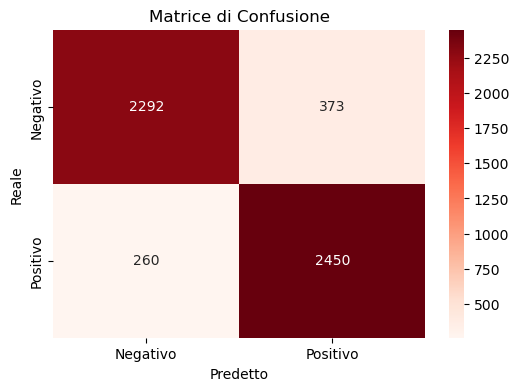

In [9]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Lista delle feature
all_features = ['timestamp', 'year', 'month', 'day', 'cleaned_text_sentiment', 'words_body', 'words_title', 'words_text',
    'normalized_tfidf_sum', 'nft', 'web3', 'community', 'blockchain', 'crypto', 'wallet', 'chain',
    'verbs_density', 'adjectives_density', 'nouns_density', 'Kincaid', 'FleschReadingEase', 'GunningFogIndex',
    'characters_per_word', 'syll_per_word', 'words_per_sentence', 'sentences_per_paragraph', 'type_token_ratio',
    'characters', 'syllables', 'words', 'wordtypes', 'sentences', 'paragraphs', 'long_words', 'complex_words',
    'topic_T1: Gaming, Virtual Worlds & Characters', 'topic_T2: Wallets, Airdrops & Ethereum Tools',
    'topic_T3: Web3, Blockchain & Digital Platforms', 'topic_T4: DeFi, Market Strategies & Liquidity',
    'topic_T5: Blockchain, Transactions & Smart Contracts', 'topic_T6: Web3 Launches, Rewards & Creators',
    'topic_T7: Human Thoughts, Emotions & Reflections', 'days_since_epoch',
    'last_btc_usd','open_btc_usd','max_btc_usd','min_btc_usd','vol_btc','var%_btc','last_eth_usd','open_eth_usd',
    'max_eth_usd','min_eth_usd','vol_eth','var%_eth','authorPostCount','authorTotalSales','authorTotalRevenue',
    'last_optimism_usd','open_optimism_usd','max_optimism_usd','min_optimism_usd','vol_optimism','var%_optimism',
    'last_tether_usd','open_tether_usd','max_tether_usd','min_tether_usd','vol_tether','var%_tether','last_usdc_usd',
    'open_usdc_usd','max_usdc_usd','min_usdc_usd','vol_usdc','var%_usdc','last_dai_usd','open_dai_usd','max_dai_usd',
    'min_dai_usd','vol_dai','var%_dai','daily_transactions_optimism','eth_active_addresses_total',
    'eth_active_addresses_receiver','eth_active_addresses_sender','optimism_active_addresses_total',
    'week_google_searches_nft','week_google_searches_crypto','week_google_searches_bitcoin',
    'week_google_searches_ethereum','week_google_searches_optimism']

# Features e target
X = df[all_features]
y = df['SuccessBinary']

# Split del dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Standardizzazione
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Modello con i migliori parametri trovati
best_gboost = GradientBoostingClassifier(
    subsample=0.9,
    n_estimators=500,
    min_samples_split=10,
    min_samples_leaf=4,
    max_depth=6,
    learning_rate=0.01,
    random_state=42
)

# Fit del modello
best_gboost.fit(X_train_scaled, y_train)

# Predizione
y_pred = best_gboost.predict(X_test_scaled)

# Report di classificazione
print("Report di classificazione:")
print(classification_report(y_test, y_pred))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=["Negativo", "Positivo"], yticklabels=["Negativo", "Positivo"])
plt.xlabel("Predetto")
plt.ylabel("Reale")
plt.title("Matrice di Confusione")
plt.show()


Caso: Classe Positiva lontano, Index 2014


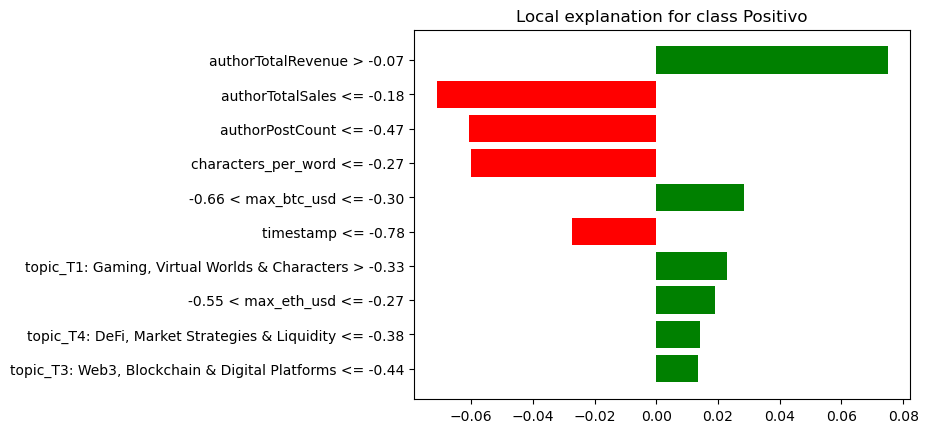


Caso: Classe Positiva vicino, Index 1204


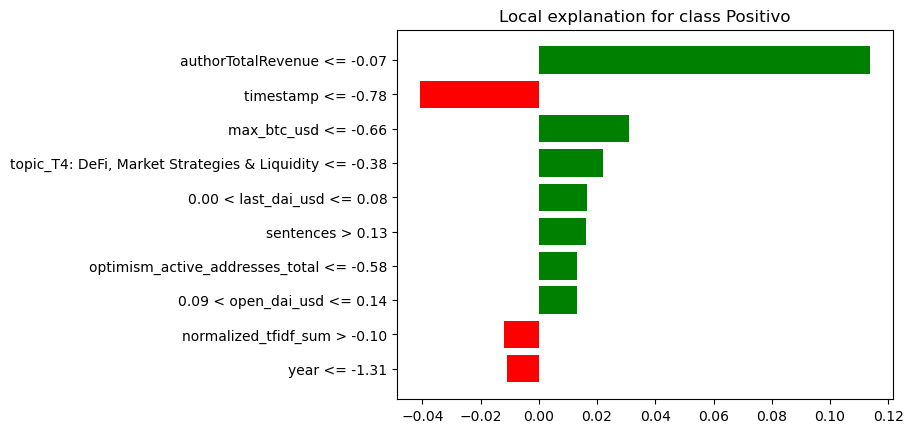


Caso: Classe Negativa lontano, Index 525


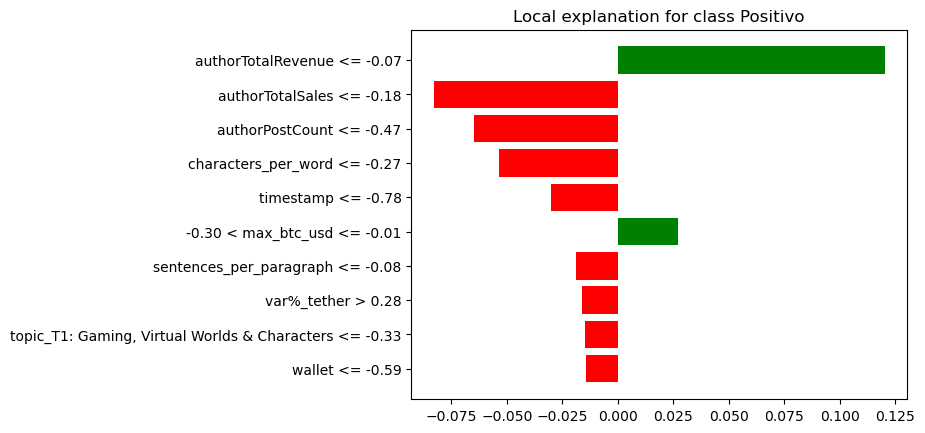


Caso: Classe Negativa vicino, Index 5153


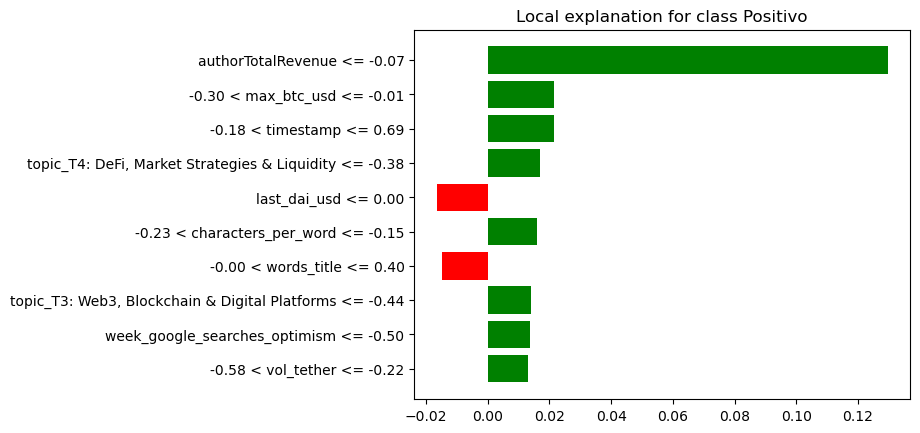

In [13]:
import numpy as np
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt

# Funzione di probabilità per LIME
def predict_proba(X):
    return best_gboost.predict_proba(X)

# Ottieni le probabilità della classe positiva
y_pred_proba = best_gboost.predict_proba(X_test_scaled)[:, 1]

# Converti y_test in array per indicizzazione
y_test_array = y_test.values

# Trova gli indici dei positivi e negativi
class_positiva = np.where(y_test_array == 1)[0]
class_negativa = np.where(y_test_array == 0)[0]

# Casi lontani dal decision boundary (probabilità molto alta o bassa)
pos_lontano = class_positiva[np.argmax(y_pred_proba[class_positiva])]
neg_lontano = class_negativa[np.argmin(y_pred_proba[class_negativa])]

# Casi vicini al decision boundary (probabilità ≈ 0.5)
pos_vicino = class_positiva[np.argmin(np.abs(y_pred_proba[class_positiva] - 0.5))]
neg_vicino = class_negativa[np.argmin(np.abs(y_pred_proba[class_negativa] - 0.5))]

# Inizializza LIME
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    mode='classification',
    feature_names=X.columns.tolist(),
    class_names=['Negativo', 'Positivo'],
    discretize_continuous=True,
    random_state=42
)

# Funzione per spiegare una specifica istanza
def explain_instance(instance_index, label):
    exp = explainer.explain_instance(
        X_test_scaled[instance_index], 
        predict_proba,
        num_features=10
    )
    print(f"\nCaso: Classe {label}, Index {instance_index}")
    exp.show_in_notebook()
    fig = exp.as_pyplot_figure()
    plt.show()

# Spiegazione dei quattro casi
explain_instance(pos_lontano, "Positiva lontano")
explain_instance(pos_vicino, "Positiva vicino")
explain_instance(neg_lontano, "Negativa lontano")
explain_instance(neg_vicino, "Negativa vicino")


Caso: Classe Positiva lontano, Index 2014


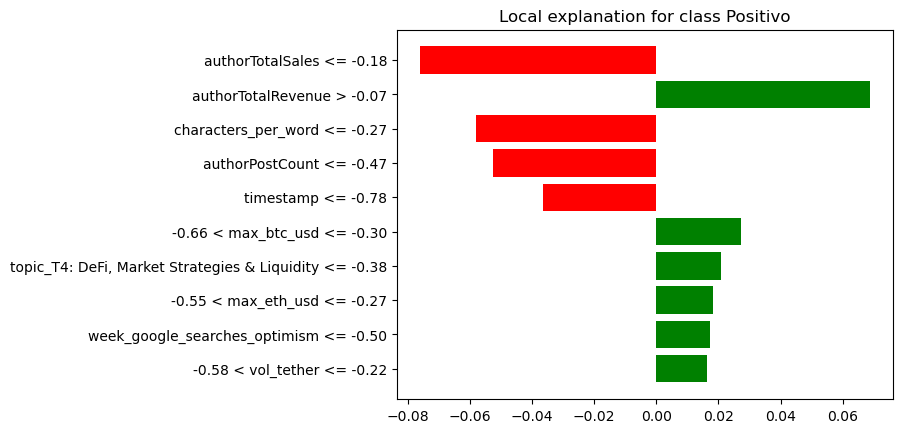

In [23]:
explain_instance(pos_lontano, "Positiva lontano")


Caso: Classe Positiva vicino, Index 1204


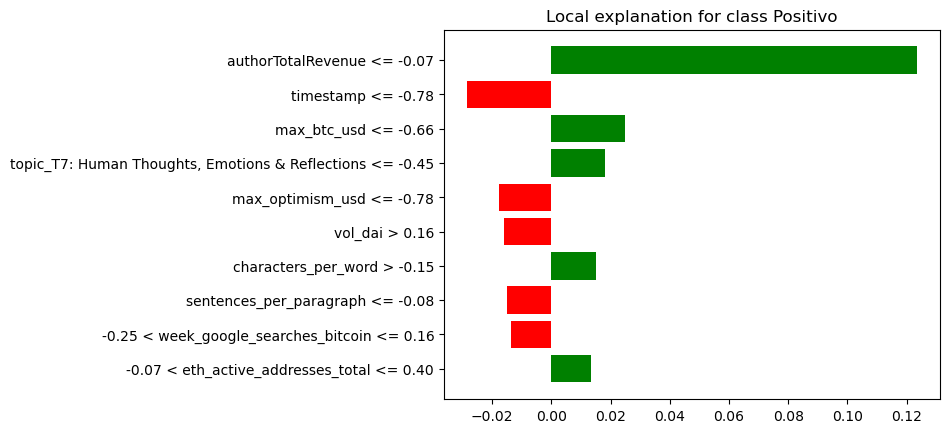

In [25]:
explain_instance(pos_vicino, "Positiva vicino")


Caso: Classe Negativa lontano, Index 525


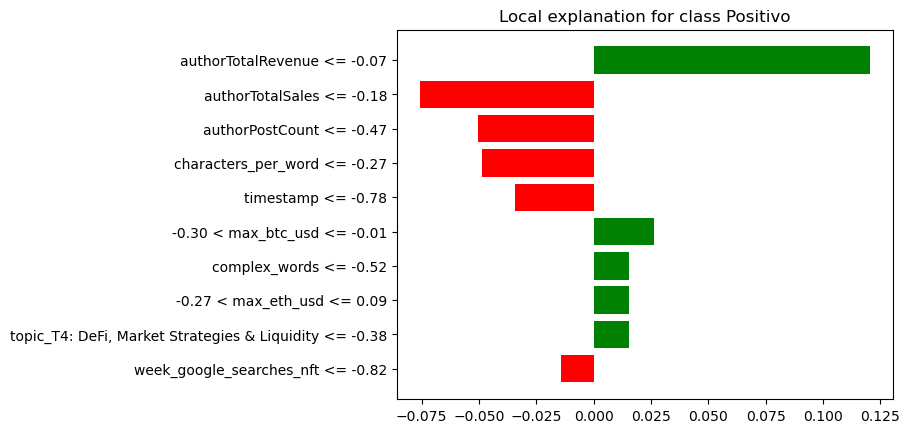

In [27]:
explain_instance(neg_lontano, "Negativa lontano")


Caso: Classe Negativa vicino, Index 5153


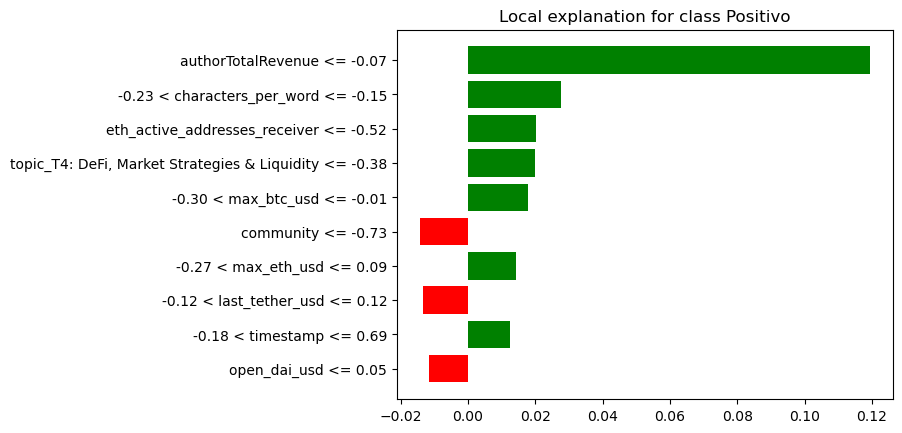

In [29]:
explain_instance(neg_vicino, "Negativa vicino")


Caso: Classe Positiva, Index 2014


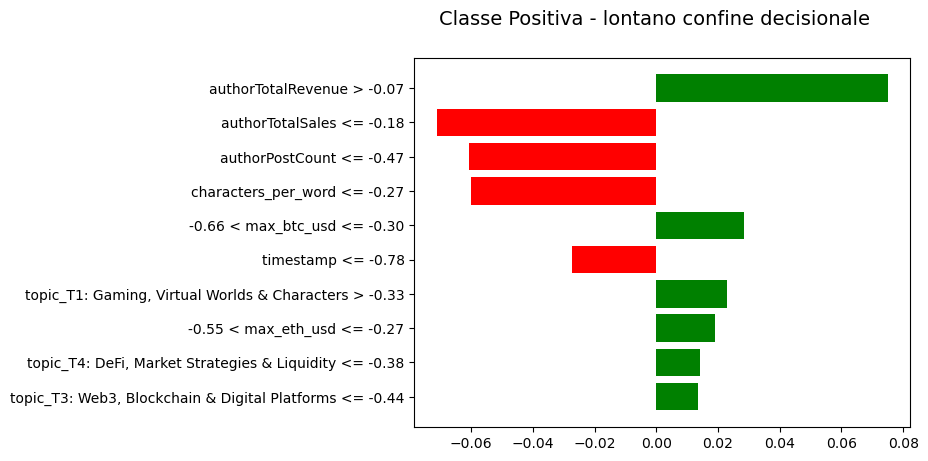


Caso: Classe Positiva, Index 1204


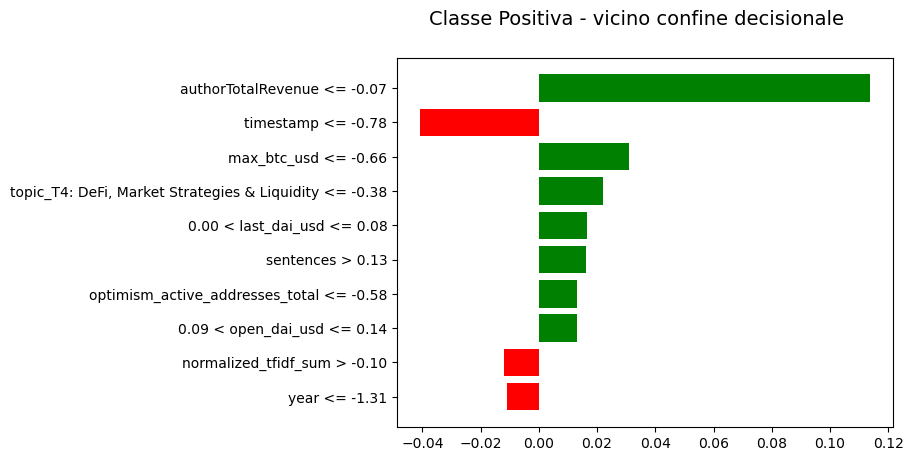


Caso: Classe Negativa, Index 525


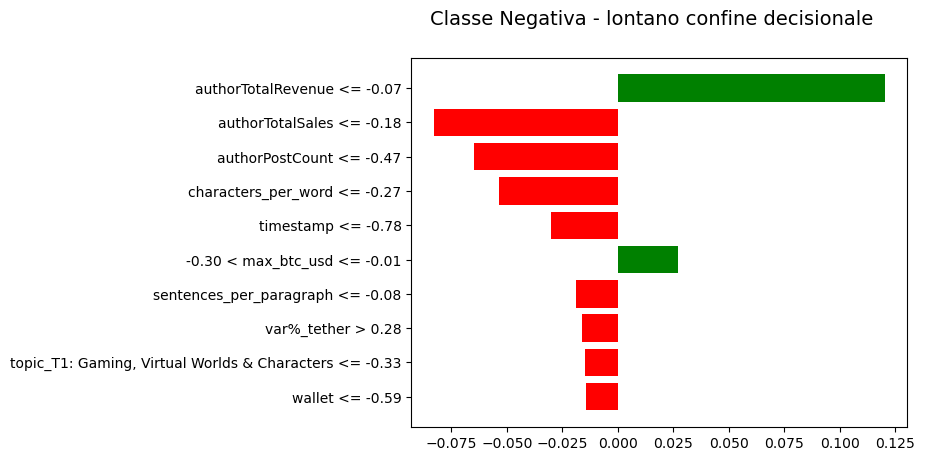


Caso: Classe Negativa, Index 5153


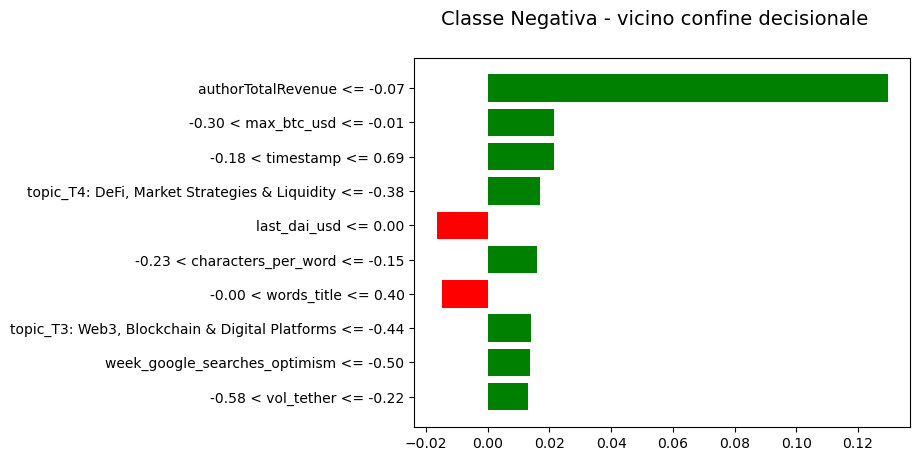

In [37]:
import numpy as np
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt

# Funzione di probabilità per LIME
def predict_proba(X):
    return best_gboost.predict_proba(X)

# Ottieni le probabilità della classe positiva
y_pred_proba = best_gboost.predict_proba(X_test_scaled)[:, 1]

# Converti y_test in array per indicizzazione
y_test_array = y_test.values

# Trova gli indici dei positivi e negativi
class_positiva = np.where(y_test_array == 1)[0]
class_negativa = np.where(y_test_array == 0)[0]

# Casi lontani dal decision boundary (probabilità molto alta o bassa)
pos_lontano = class_positiva[np.argmax(y_pred_proba[class_positiva])]
neg_lontano = class_negativa[np.argmin(y_pred_proba[class_negativa])]

# Casi vicini al decision boundary (probabilità ≈ 0.5)
pos_vicino = class_positiva[np.argmin(np.abs(y_pred_proba[class_positiva] - 0.5))]
neg_vicino = class_negativa[np.argmin(np.abs(y_pred_proba[class_negativa] - 0.5))]

# Inizializza LIME
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    mode='classification',
    feature_names=X.columns.tolist(),
    class_names=['Negativo', 'Positivo'],
    discretize_continuous=True,
    random_state=42
)

# Funzione per spiegare una specifica istanza
def explain_instance(instance_index, label, distance_from_boundary):
    exp = explainer.explain_instance(
        X_test_scaled[instance_index], 
        predict_proba,
        num_features=10
    )
    print(f"\nCaso: Classe {label}, Index {instance_index}")
    
    # Ottieni la figura senza il titolo predefinito
    fig = exp.as_pyplot_figure()

    # Imposta il titolo personalizzato e rimuovi il titolo predefinito
    fig.suptitle(f"Classe {label} - {distance_from_boundary} confine decisionale", fontsize=14)

    # Rimuovi il titolo predefinito se appare
    plt.title('')  # Questo rimuove il titolo di default che LIME aggiunge

    # Mostra il grafico
    plt.show()

# Spiegazione dei quattro casi
explain_instance(pos_lontano, "Positiva", "lontano")
explain_instance(pos_vicino, "Positiva", "vicino")
explain_instance(neg_lontano, "Negativa", "lontano")
explain_instance(neg_vicino, "Negativa", "vicino")